In [1]:
library(repr)
options(repr.plot.width=10, repr.plot.height=7)

### Recap Homework for last week

After re-reading the documentation on Phoible, I noticed that for some languages, several inventories (from different sources) are listed. To get an accurate picture of inventory sizes, we should consider only one inventory per language.

In [2]:
library(tidyverse)
library(tmap)
library(sf)

── Attaching packages ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.1 ──
✔ ggplot2 3.3.3     ✔ purrr   0.3.4
✔ tibble  3.1.2     ✔ dplyr   1.0.6
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1
── Conflicts ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
Linking to GEOS 3.9.1, GDAL 3.2.2, PROJ 8.0.0


In [3]:
url_ <- "https://github.com/phoible/dev/blob/master/data/phoible.csv?raw=true"
col_types <- cols(InventoryID='i', Marginal='l', .default='c')
phoible <- read_csv(url(url_), col_types=col_types)

In [4]:
phoible %>% 
    slice_sample(n=10)

InventoryID,Glottocode,ISO6393,LanguageName,SpecificDialect,GlyphID,Phoneme,Allophones,Marginal,SegmentClass,...,retractedTongueRoot,advancedTongueRoot,periodicGlottalSource,epilaryngealSource,spreadGlottis,constrictedGlottis,fortis,raisedLarynxEjective,loweredLarynxImplosive,click
2423,shan1277,shn,Shan,Shan (Hsi Paw),006A,j,NA,FALSE,consonant,...,0,0,+,-,-,-,-,-,-,-
1198,brok1247,bkk,Brokskat,NA,0078+0325,x̥,x̥,FALSE,consonant,...,0,0,-,-,-,-,-,-,-,-
1067,tibe1272,bod,Tibetan,Lhasa,025B,ɛ,ɛ,FALSE,vowel,...,-,-,+,-,-,-,0,-,-,0
1903,embe1262,cmi,Emberá-Chamí,NA,006D,m,NA,NA,consonant,...,0,0,+,-,-,-,-,-,-,-
2631,goon1238,gni,Gooniyandi,NA,0236,ȶ,NA,FALSE,consonant,...,0,0,-,-,-,-,-,-,-,-
2277,nucl1305,kan,Kannada,Kannada (Standard),0069,i,NA,FALSE,vowel,...,-,-,+,-,-,-,0,-,-,0
1489,saam1283,lsm,Lusaamia,NA,0074,t,t,FALSE,consonant,...,0,0,-,-,-,-,-,-,-,-
1715,brok1247,bkk,Brokskat,NA,0074,t,NA,NA,consonant,...,0,0,-,-,-,-,-,-,-,-
1141,gali1258,glg,Galician,NA,0283,ʃ,ʃ,FALSE,consonant,...,0,0,-,-,-,-,-,-,-,-
2524,lezg1247,lez,Lezgian,Lezgian (Güne),006A,j,NA,FALSE,consonant,...,0,0,+,-,-,-,-,-,-,-


In [5]:
numberOfSegments <- phoible %>%
    group_by(InventoryID) %>%
    summarise(nSegments = n()) %>%
    left_join(phoible %>% select(InventoryID, Glottocode, LanguageName) %>% distinct()) %>%
    group_by(Glottocode) %>%
    summarise(nSegments = median(nSegments)) %>%
    arrange(desc(nSegments))

Joining, by = "InventoryID"


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


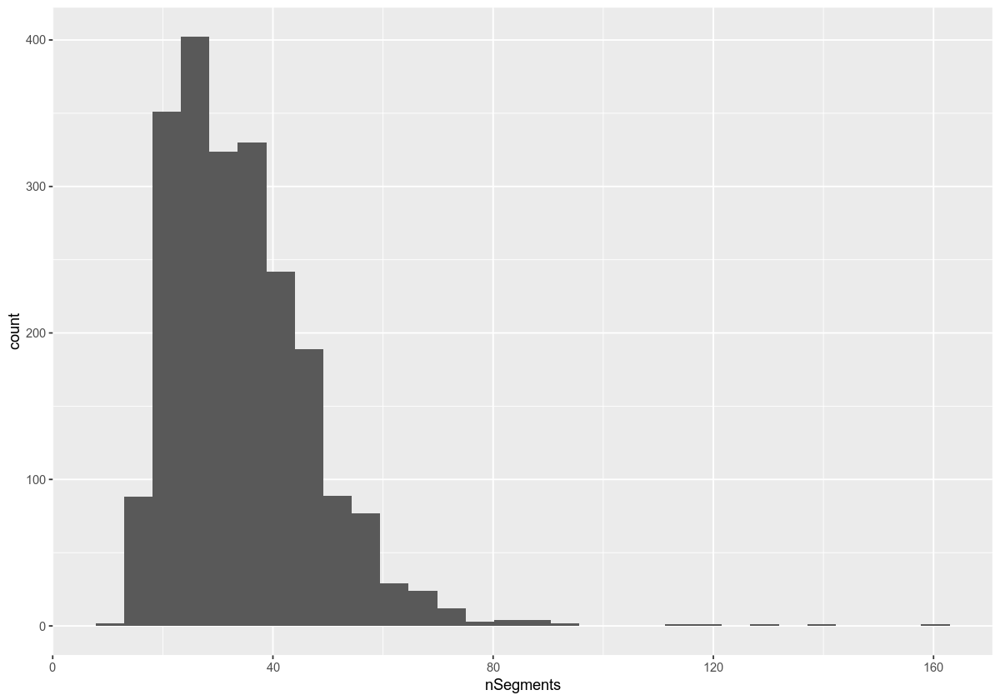

In [6]:
numberOfSegments %>%
    ggplot() +
    geom_histogram(aes(x=nSegments))

In [7]:
url_ <- "https://cdstar.eva.mpg.de/bitstreams/EAEA0-F8BB-0AB6-96FA-0/languages_and_dialects_geo.csv"
glottolog <- read_csv(url(url_)) %>%
    drop_na(longitude, latitude) %>%
    st_as_sf(coords = c("longitude", "latitude")) %>%
    transmute(Glottocode = glottocode)


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  glottocode = col_character(),
  name = col_character(),
  isocodes = col_character(),
  level = col_character(),
  macroarea = col_character(),
  latitude = col_double(),
  longitude = col_double()
)



In [8]:
segmentFrequencies <- numberOfSegments %>%
    inner_join(glottolog) %>%
    st_as_sf()

Joining, by = "Glottocode"


In [9]:
segmentFrequencies %>%
    slice_sample(n=10)

Warning message in fun(libname, pkgname):
“rgeos: versions of GEOS runtime 3.9.1-CAPI-1.14.2
and GEOS at installation 3.9.1dev-CAPI-1.14.1differ”Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson


Glottocode,nSegments,geometry
cent2194,39,POINT (-2.40872 32.7415)
gang1268,18,POINT (149.416 -22.7637)
paum1247,28,POINT (-64.2803 -5.78403)
mato1253,33,POINT (-60.62887 -9.172609)
avat1244,50,POINT (0.41314 6.8688)
wich1264,28,POINT (-62.1757 -23.1633)
amdo1237,58,POINT (100.485 34.5177)
khas1269,29,POINT (91.9998 24.977)
kwom1262,31,POINT (142.664 -4.08721)
cent2128,36,POINT (-170.272 63.4308)


In [14]:
world.160e <- read_sf("data/world_160e.gpkg")


In [15]:
bg.map <- world.160e %>% 
    st_transform("+proj=eqearth lon_0=160") %>%
    tm_shape() +
    tm_fill()


In [17]:
st_crs(segmentFrequencies) <- 4326

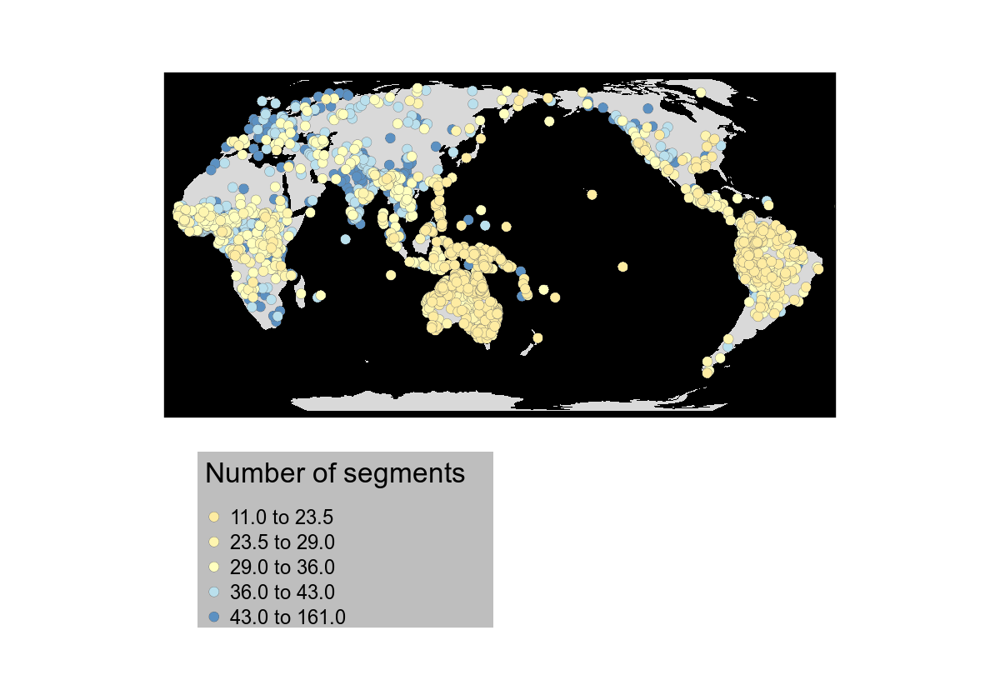

In [18]:
tmap_options(bg.color = "black", legend.text.color = "black")
solution <- bg.map +
    segmentFrequencies %>%
    tm_shape() +
    tm_symbols(
        col="nSegments",
        style = "quantile",
        title.col = "Number of segments",
        palette="RdYlBu",
        size=.05,
        border.lwd=0.1
    ) + 
    tm_layout(legend.outside=T,
              legend.outside.position = "bottom", scale=3, 
              legend.bg.color="grey") 
solution

In [20]:
library(spdep)
pad_voronoi <- read_sf("data/pad_voronoi.shp")

## Homework for this week

In [21]:
cvRatio <- read_csv("data/asjp_cvRatio.csv") %>%
    drop_na() %>%
    filter(cvRatio < Inf) %>%
    st_as_sf(coords = c("Longitude", "Latitude")) 
cvRatio %>%
    slice_sample(n=10)



── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  Name = col_character(),
  Longitude = col_double(),
  Latitude = col_double(),
  cvRatio = col_double()
)



Name,cvRatio,geometry
STANDARD_ARABIC_2,1.428571,POINT (42 25)
LOVARA_ROMANI,1.509615,POINT (21.5 47)
MOLALA,1.906250,POINT (-122.5 44.5)
MINGORA_PASHTO,1.338710,POINT (72.36 34.78)
MAKU,0.968750,POINT (-61.66 3.42)
LAWANGAN,1.108434,POINT (116 -2)
GURBET_ROMANI,1.632653,POINT (19.95 43.35)
NORTHERN_SHAN,1.758065,POINT (98.03 23.7)
KOROBORO_SENNI,1.245902,POINT (0 16)
LOGOLI,1.000000,POINT (34.67 0.17)


In [22]:
st_crs(cvRatio) <- 4326

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


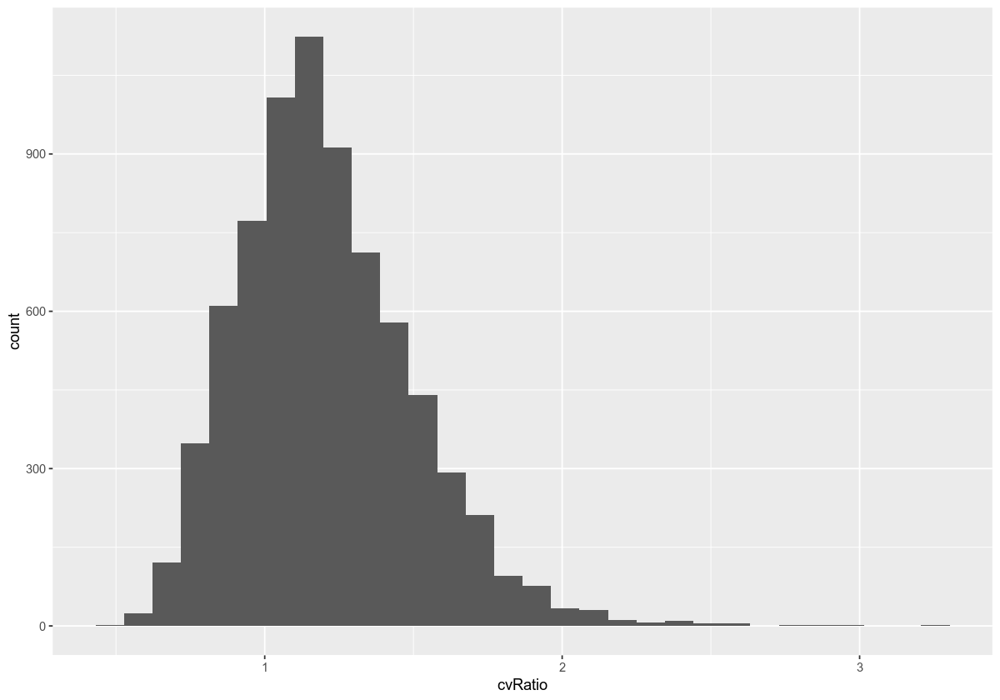

In [23]:
cvRatio %>%
    ggplot() +
    geom_histogram(aes(x=cvRatio))

In [24]:
cvRatio %>%
    arrange(cvRatio) %>% slice_tail(n=10)

Name,cvRatio,geometry
BELLA_COOLA,2.541667,POINT (-126.67 52.5)
MANAMBU,2.564103,POINT (142.83 -4.25)
HAN,2.594595,POINT (-140.35 64.5)
KILDIN_SAAMI_2,2.625000,POINT (37 67)
THOMPSON,2.630769,POINT (-121.75 49.75)
KALMYK,2.785714,POINT (44.27 46.32)
SHUSWAP,2.859375,POINT (-120 52)
MONTANA_SALISH,2.945455,POINT (-117 48)
SPOKANE,3.222222,POINT (-117.75 47.67)
OKANAGAN_COLVILLE,3.301887,POINT (-118.5 49.5)


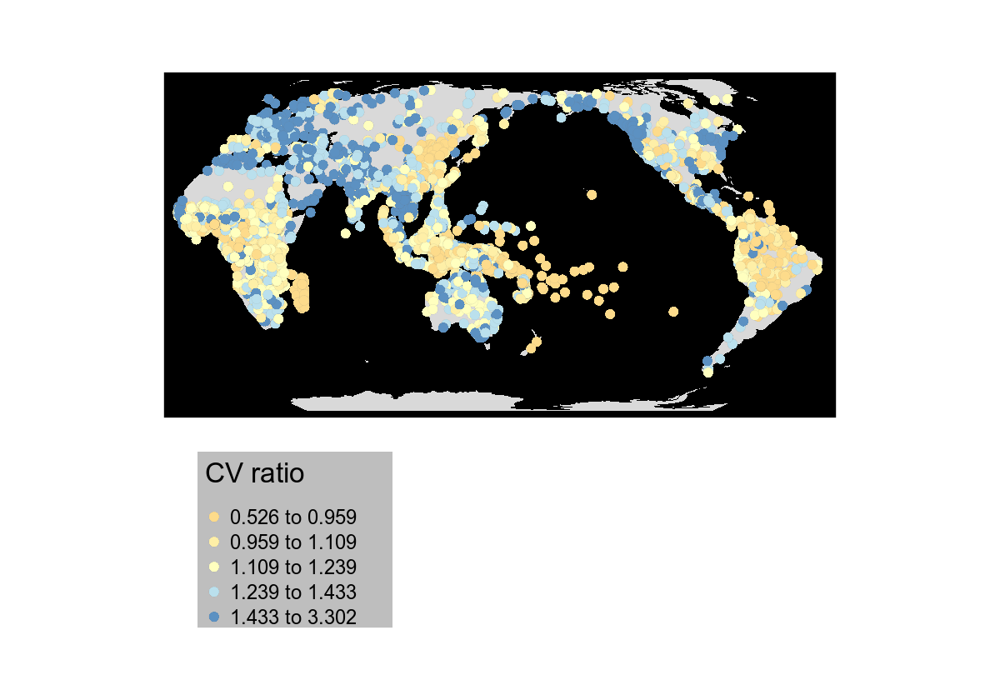

In [25]:
bg.map + (
cvRatio %>%
    tm_shape() +
    tm_symbols(
        col="cvRatio",
        title.col = "CV ratio",
        style = "quantile",      
        size=.05,
        border.lwd=0.02,
        palette="RdYlBu",

    ) +
    tm_layout(legend.outside=T,
              legend.outside.position = "bottom", scale=3, 
              legend.bg.color="grey") 
    
)

In [26]:
coo.asjp <- st_coordinates(cvRatio)

In [27]:
dist2mi <- function(x, coo, lower, upper) {
    S.dist  <-  dnearneigh(coo, lower, upper, longlat=T) 
    lw <- nb2listw(S.dist, style="W",zero.policy=T) 
    return(moran.mc(x, lw, nsim=999,zero.policy=T))
}

In [28]:
dist2mi(cvRatio$cvRatio, coo.asjp, 0, 100)


	Monte-Carlo simulation of Moran I

data:  x 
weights: lw  
number of simulations + 1: 1000 

statistic = 0.52374, observed rank = 1000, p-value = 0.001
alternative hypothesis: greater


## Local Moran's I

For the next topic, I will use the Delauney triangulation (i.e., the neihborhood relation derived from the Voronoi tesslation).

Let us re-consider the linear regression that let to Moran's I. We can quantify for each observation how strongly it contributes to the regression coefficient.


In [29]:
pad_nb <- poly2nb(pad_voronoi, queen=TRUE)
pad_lw <- nb2listw(pad_nb, style="W", zero.policy = T)
r.lag = lag.listw(pad_lw, pad_voronoi$r)


`geom_smooth()` using formula 'y ~ x'


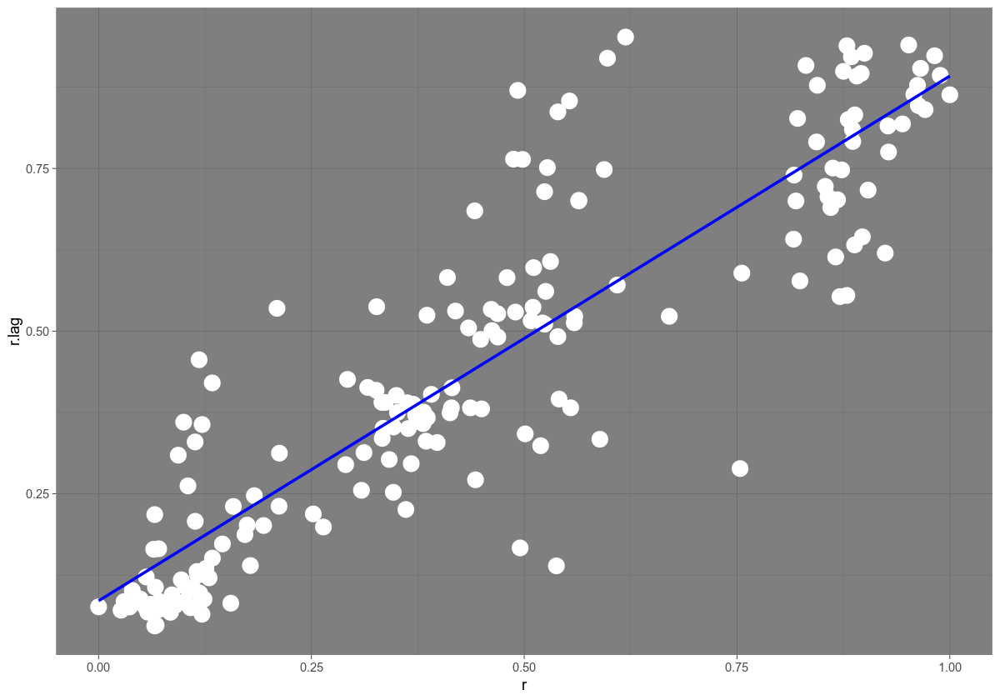

In [30]:
pad_voronoi %>% 
    ggplot() +
    geom_point(aes(x=r, y=r.lag), size=5, col='white') +
    geom_smooth(aes(x=r, y=r.lag), method='lm', se=F, col='blue') +
    theme_dark()
    

The formula for Moran's I is

$$
\begin{aligned}
I &= \frac{N}{W} \frac{\sum_{i,j} w_{ij}(x_i-\overline{x})(x_j-\overline{x})}{\sum_i(x_i-\overline{x})^2}\\
& = \frac{N}{W\sum_j(x_j-\overline{x})^2} \sum_i (x_i-\overline{x})\sum_j w_{ij}(x_j-\overline{x})
\end{aligned}
$$

Leaving out the first $\sum$ gives us the individual contributions of each data point.

$$
\begin{aligned}
I_i &\propto (x_i-\overline{x})\sum_j w_{ij}(x_j-\overline{x})
\end{aligned}
$$

`geom_smooth()` using formula 'y ~ x'


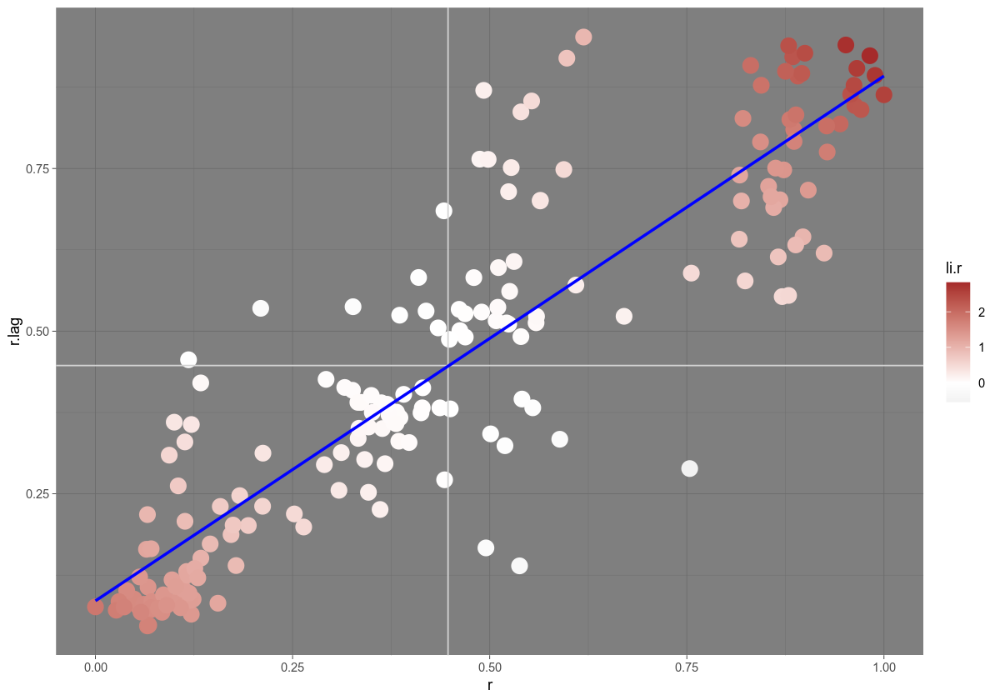

In [31]:
pad_voronoi %>% 
    mutate(li.r = localmoran(pad_voronoi$r, pad_lw)[,1]) %>%
    ggplot() +
    geom_point(aes(x=r, y=r.lag, col=li.r), size=5) +
    scale_color_gradient2(
    low = "grey", 
    mid = "white", 
    high = "brown", 
    midpoint = 0
    ) + 
    geom_hline(yintercept = mean(pad_voronoi$r), col='lightgrey')+
    geom_vline(xintercept = mean(pad_voronoi$r), col='lightgrey')+
    geom_smooth(aes(x=r, y=r.lag), method='lm', se=F, col='blue') +
    theme_dark()
    



*Local Moran's I* is a measure of the degree to which the value at a point can be predicted from its neighborhood.

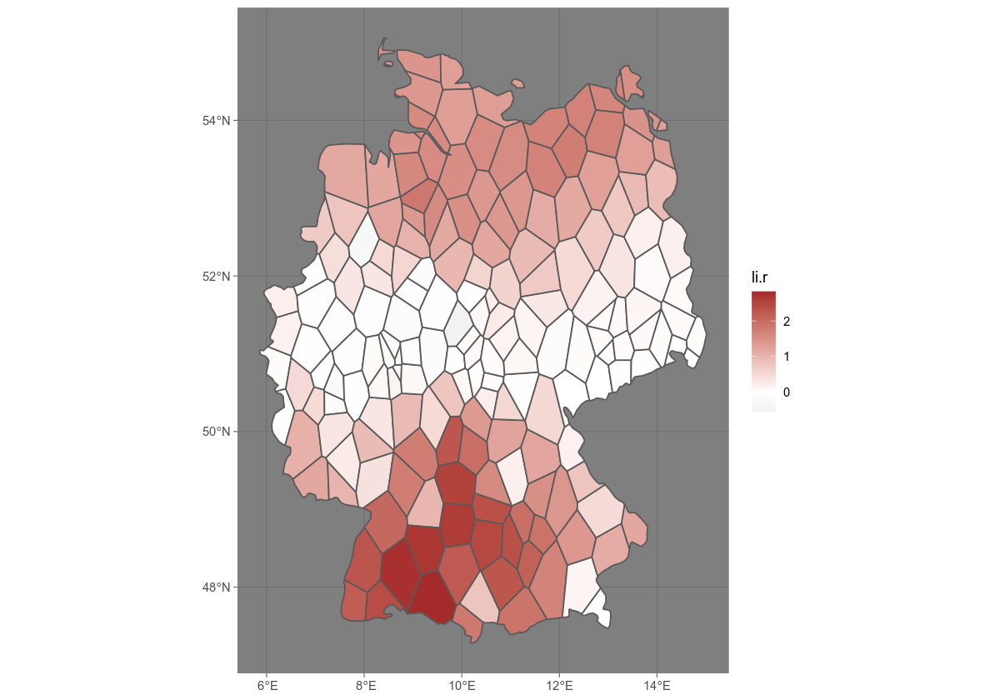

In [32]:
pad_voronoi %>% 
    mutate(li.r = localmoran(pad_voronoi$r, pad_lw)[,1]) %>%
    ggplot() +
    geom_sf(aes(fill=li.r)) +
    scale_fill_gradient2(
    low = "grey", 
    mid = "white", 
    high = "brown", 
    midpoint = 0
  ) +theme_dark()
    



The same procedure for the other two dimensions.

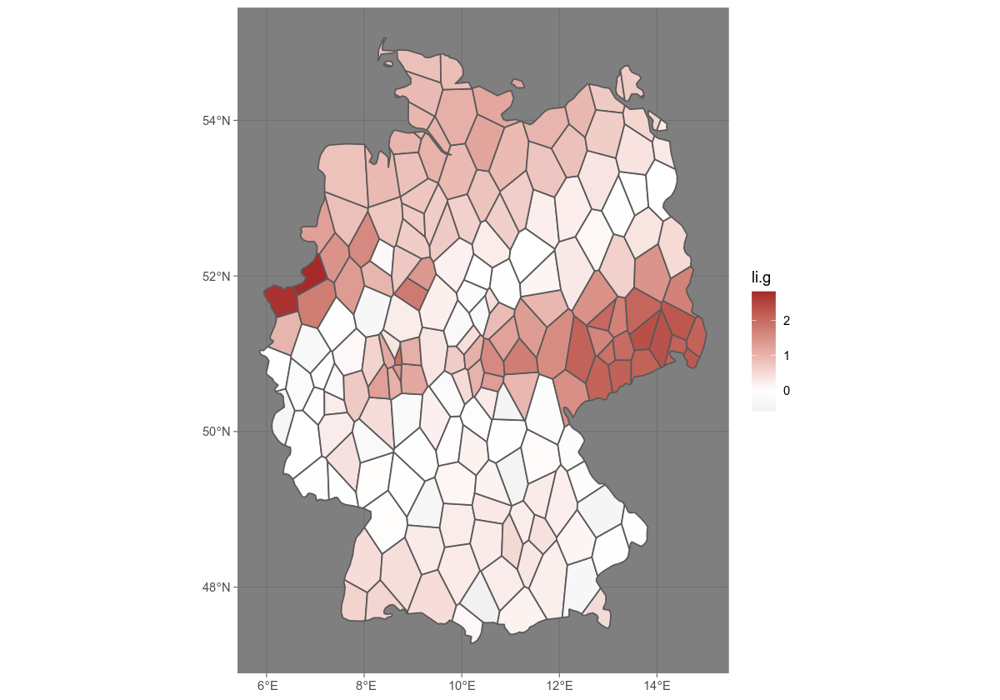

In [33]:
pad_voronoi %>% 
    mutate(li.g = localmoran(pad_voronoi$g, pad_lw)[,1]) %>%
    ggplot() +
    geom_sf(aes(fill=li.g)) +
    scale_fill_gradient2(
    low = "grey", 
    mid = "white", 
    high = "brown", 
    midpoint = 0
  ) + theme_dark()
    



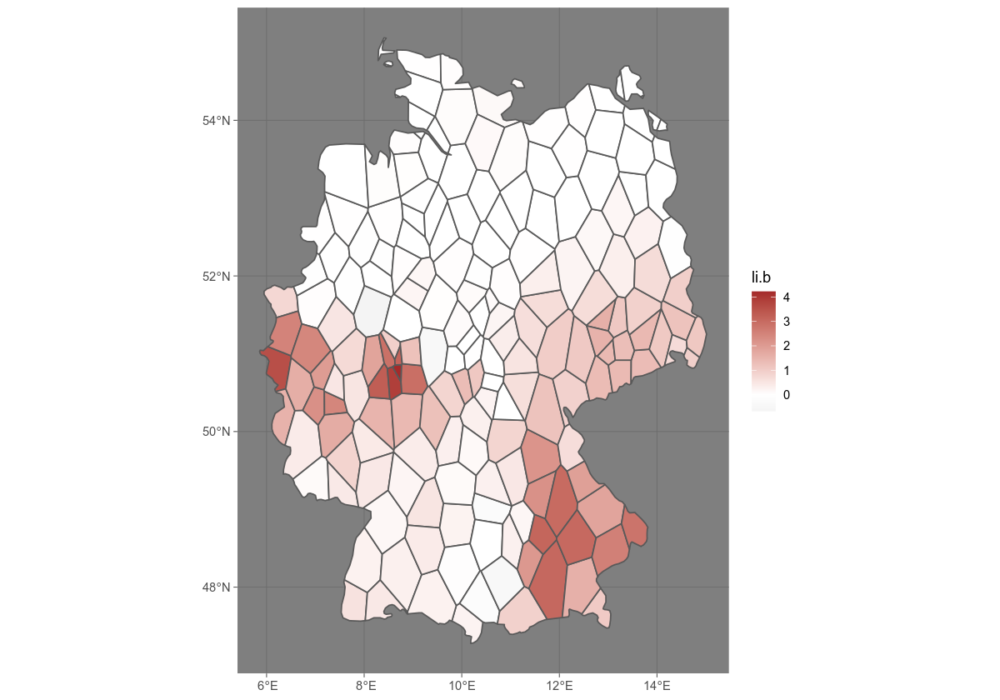

In [34]:
pad_voronoi %>% 
    mutate(li.b = localmoran(pad_voronoi$b, pad_lw)[,1]) %>%
    ggplot() +
    geom_sf(aes(fill=li.b)) +
    scale_fill_gradient2(
    low = "grey", 
    mid = "white", 
    high = "brown", 
    midpoint = 0
  ) + theme_dark()
    

## Correlograms of global linguistic data sets

### Segment inventory sizes

In [35]:
coo.phoible <- st_coordinates(segmentFrequencies)

In [36]:
dist2mi(segmentFrequencies$nSegments, coo.phoible, 0, 300)


	Monte-Carlo simulation of Moran I

data:  x 
weights: lw  
number of simulations + 1: 1000 

statistic = 0.45646, observed rank = 1000, p-value = 0.001
alternative hypothesis: greater


In [37]:
nBins <- 150
binWidth <- 50
binCenters <- binWidth*(1:nBins)-binWidth/2

In [33]:
#crlg.ph <- c()
#for (i in 1:nBins) {
#    binCenter <- binCenters[i]
#    MI <- dist2mi(segmentFrequencies$nSegments, coo.phoible, binCenter-binWidth/2, binCenter+binWidth/2)
#    mi <- as.numeric(MI$statistic)
#    signif <- MI$p.value < 0.05
#    crlg.ph <- rbind(crlg.ph, c(binCenter, mi, signif))
#}

In [34]:
#df.phoible <- tibble(data.frame(crlg.ph))
#colnames(df.phoible) <- c("distance", "I", "significant")
#df.phoible$significant <- as.character(df.phoible$significant)

#write.csv(df.phoible, "data/phoible_correlogram.csv")

In [38]:
df.phoible <- read_csv("data/phoible_correlogram.csv")
df.phoible$significant <- as.character(df.phoible$significant)

Warning message:
“Missing column names filled in: 'X1' [1]”
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  X1 = col_double(),
  distance = col_double(),
  I = col_double(),
  significant = col_double()
)



`geom_smooth()` using formula 'y ~ s(x, bs = "cs")'


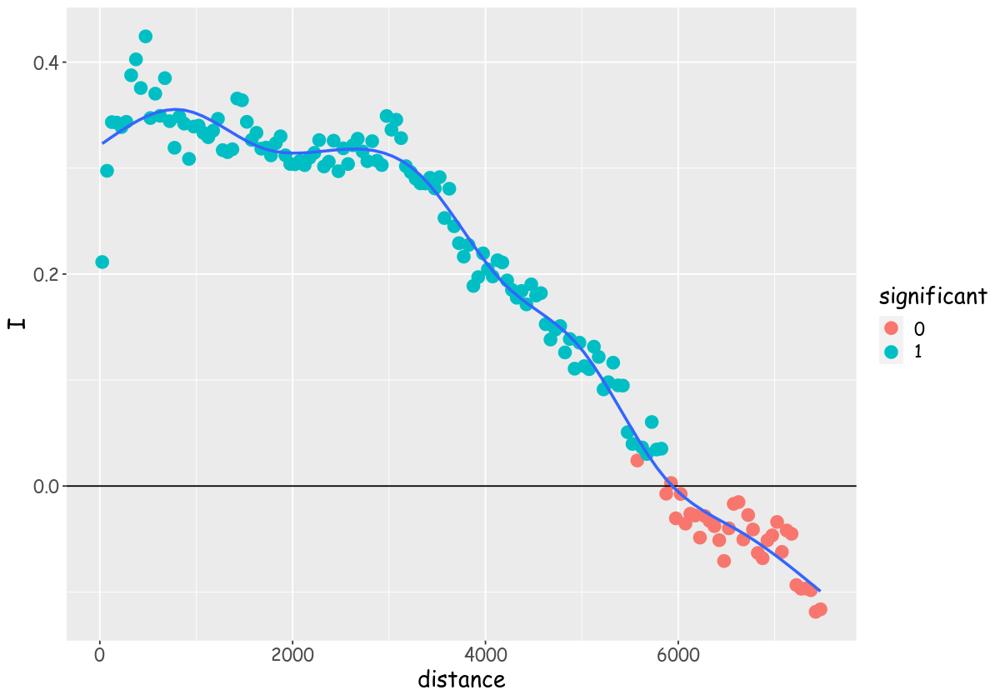

In [39]:


df.phoible %>%
    ggplot() +
    geom_point(aes(x=distance, y=I, col=significant),size=4) +
    geom_hline(yintercept = 0) +
    theme(text=element_text(size=16,  family="Comic Sans MS")) +
    geom_smooth(aes(x=distance, y=I), method="gam", se=F)


With `plotly`, a ggplot can be turned into an interactive plot.

In [40]:
library(plotly)


Attaching package: ‘plotly’

The following object is masked from ‘package:ggplot2’:

    last_plot

The following object is masked from ‘package:stats’:

    filter

The following object is masked from ‘package:graphics’:

    layout



In [41]:
p <- df.phoible %>%
    ggplot() +
    geom_point(aes(x=distance, y=I, col=significant),size=2) +
    geom_hline(yintercept = 0) +
    theme(text=element_text(size=16,  family="Comic Sans MS")) +
    geom_smooth(aes(x=distance, y=I), method="gam", se=F) 
ggplotly(p)

`geom_smooth()` using formula 'y ~ s(x, bs = "cs")'


HTML widgets cannot be represented in plain text (need html)

### CV ratio

In [42]:
#crlg.cv <- c()
#for (i in 1:nBins) {
#    binCenter <- binCenters[i]
#    MI <- dist2mi(cvRatio$cvRatio, coo.asjp, binCenter-binWidth/2, binCenter+binWidth/2)
#    mi <- as.numeric(MI$statistic)
#    signif <- MI$p.value < 0.05
#    crlg.cv <- rbind(crlg.cv, c(binCenter, mi, signif))
#}

In [43]:
#df.cv <- tibble(data.frame(crlg.cv))
#colnames(df.cv) <- c("distance", "I", "significant")
#df.cv$significant <- as.character(df.cv$significant)

In [44]:
#write.csv(df.cv, "data/cv_correlogram.csv")

In [45]:
df.cv <- read_csv("data/cv_correlogram.csv")
df.cv$significant <- as.character(df.cv$significant)

Warning message:
“Missing column names filled in: 'X1' [1]”
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  X1 = col_double(),
  distance = col_double(),
  I = col_double(),
  significant = col_double()
)



In [46]:
p2 <- df.cv %>%
    ggplot() +
    geom_point(aes(x=distance, y=I, col=significant),size=2) +
    geom_hline(yintercept = 0) +
    theme(text=element_text(size=16,  family="Comic Sans MS")) +
    geom_smooth(aes(x=distance, y=I), method="gam", se=F) 
ggplotly(p2)

`geom_smooth()` using formula 'y ~ s(x, bs = "cs")'


HTML widgets cannot be represented in plain text (need html)


## Spatial smoothing

Real data contain noise and outliers, which may mask spatial trends. For the purpose of exploratory data analysis, it may be helpful to *smooth* data.

A very simple and robust smoothing technique is to replace each data point by the average of its neighbors. Note that this is the same quantity that is used to compute Moran's I.

Let us try this with the German dialect data.

In [47]:
r.lag <- lag.listw(pad_lw, pad_voronoi$r)
g.lag <- lag.listw(pad_lw, pad_voronoi$g)
b.lag <- lag.listw(pad_lw, pad_voronoi$b)

In [48]:
pad_voronoi %>%
    mutate(r.lag = r.lag) %>%
    mutate(g.lag = g.lag) %>%
    mutate(b.lag = b.lag) %>%
    mutate(col.lag = rgb(r.lag, g.lag, b.lag)) -> pad_voronoi_lag

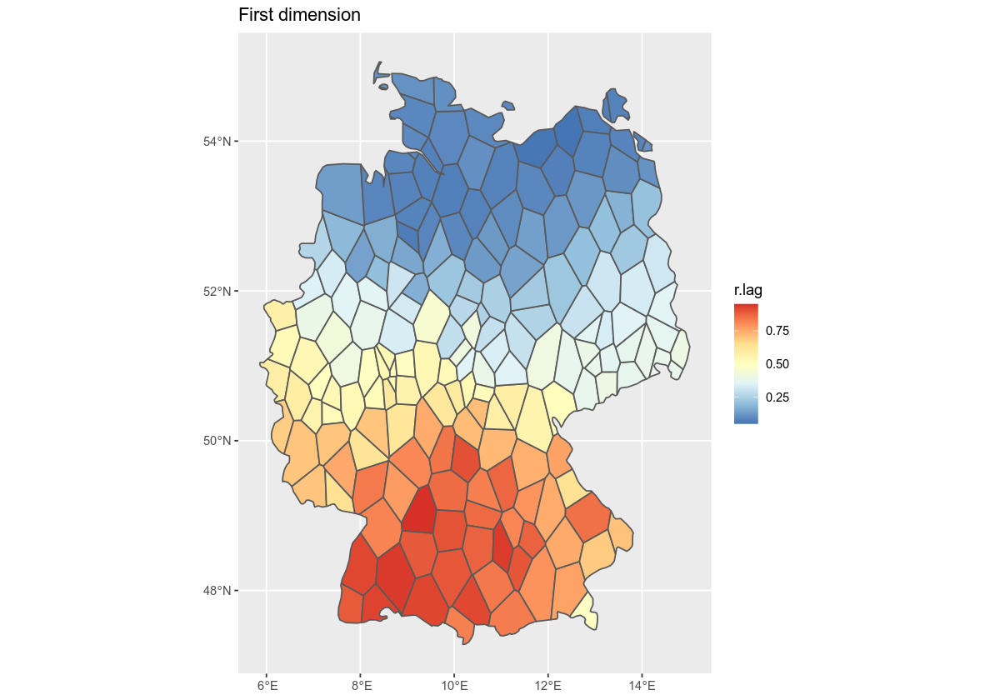

In [49]:
pad_voronoi_lag %>%
    ggplot() +
    geom_sf(aes(fill=r.lag)) +
    scale_fill_distiller(palette = "RdYlBu") +
    ggtitle("First dimension")

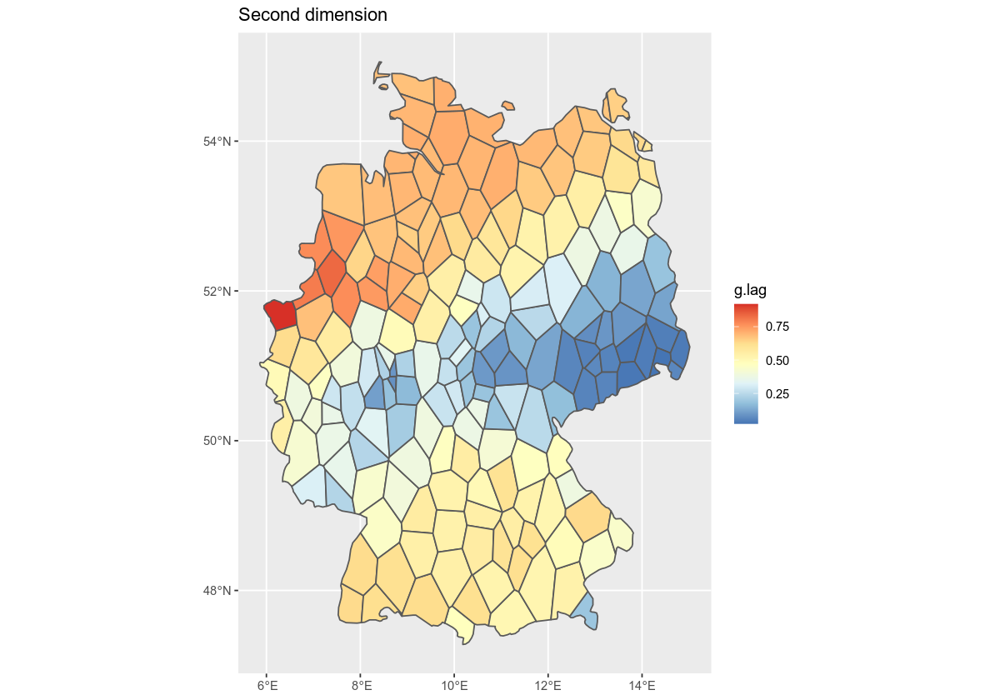

In [50]:
pad_voronoi_lag %>%
    ggplot() +
    geom_sf(aes(fill=g.lag)) +
    scale_fill_distiller(palette = "RdYlBu") +
    ggtitle("Second dimension")

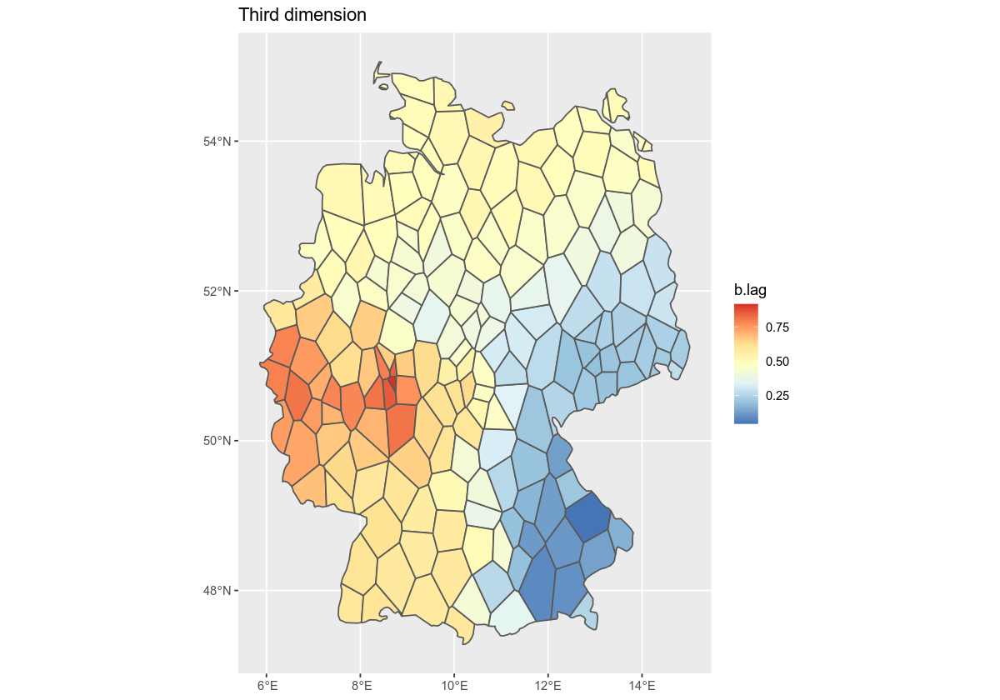

In [51]:
pad_voronoi_lag %>%
    ggplot() +
    geom_sf(aes(fill=b.lag)) +
    scale_fill_distiller(palette = "RdYlBu") +
    ggtitle("Third dimension")

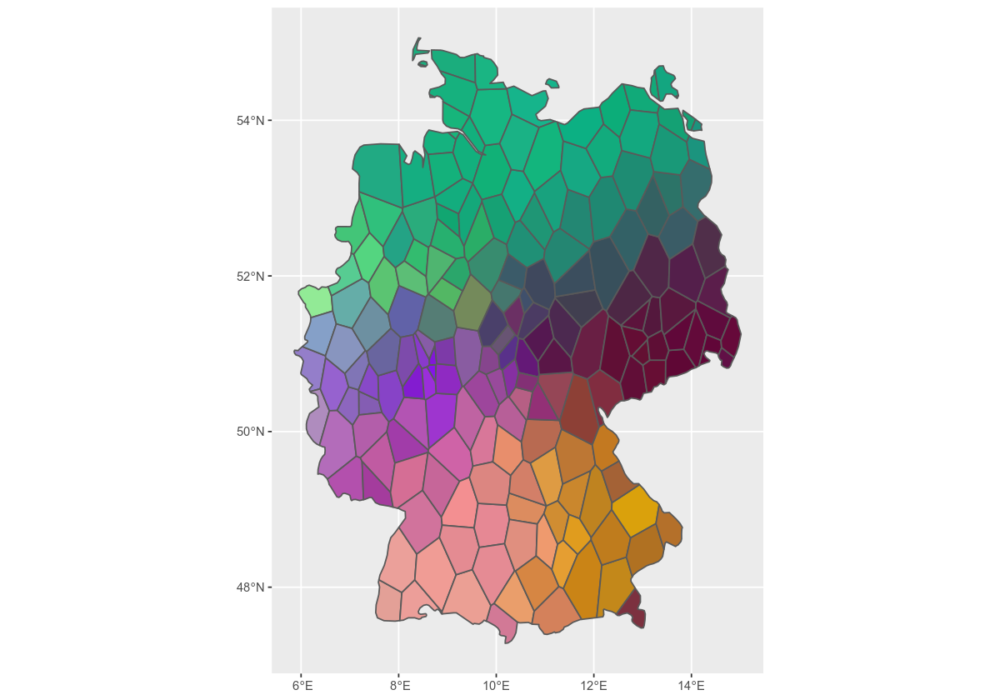

In [52]:
pad_voronoi_lag %>%
    ggplot() +
    geom_sf(fill=pad_voronoi_lag$col.lag)

### Smoothing of the CV ratio data

I will work with the Delauney triangualtion and use Voronoi tesselation for the plot.

- **First step**: Construct Voronoi diagrams


In [53]:
v <- cvRatio %>%
    st_geometry() %>%
    st_coordinates() %>%
    st_multipoint() %>%
    st_voronoi() 


In [54]:
v_sfc <- v %>%
    lapply(function(x) x) %>%
    st_sfc()
st_crs(v_sfc) <- 4326

In [55]:
sf_use_s2(F)

In [56]:
cvVoronoi <- v_sfc %>% 
    st_sf() %>%
    st_join(cvRatio) %>%
    st_intersection(st_union(world.160e))

Warning message in st_is_longlat(x):
“bounding box has potentially an invalid value range for longlat data”although coordinates are longitude/latitude, st_intersects assumes that they are planar
although coordinates are longitude/latitude, st_union assumes that they are planar
Warning message in st_is_longlat(x):
“bounding box has potentially an invalid value range for longlat data”although coordinates are longitude/latitude, st_intersection assumes that they are planar
Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”

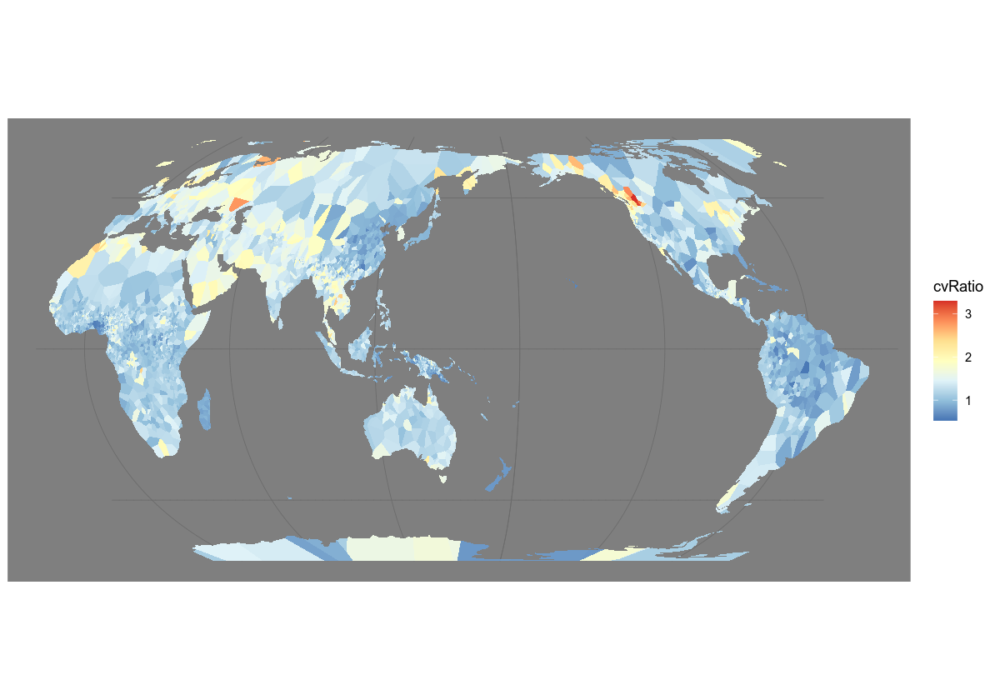

In [57]:
cvVoronoi %>%
    st_transform("+proj=eqearth lon_0=160") %>%
    ggplot() +
    geom_sf(aes(fill=cvRatio), size=0) +
    scale_fill_distiller(palette = "RdYlBu") +
    theme_dark()

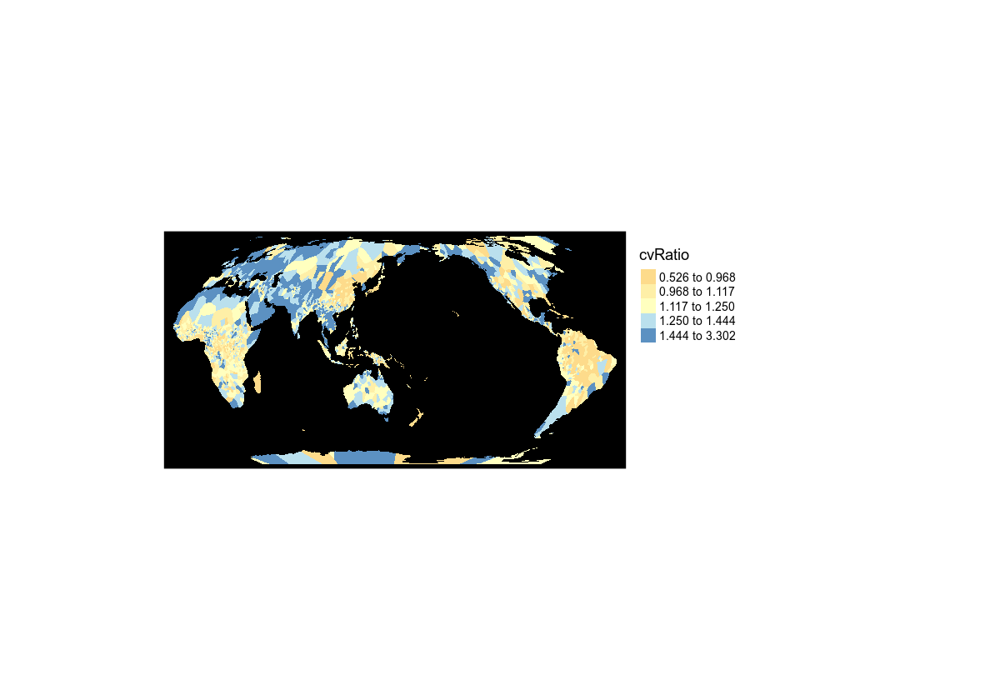

In [58]:
cvVoronoi %>%
    st_transform("+proj=eqearth lon_0=160") %>%
    tm_shape() +
    tm_fill(col="cvRatio", style="quantile", palette = "RdYlBu")  +
    tm_layout(legend.outside=T)

- **Second step**: Construct neighborhood list

In [59]:
cv_nb <- poly2nb(cvVoronoi, queen=TRUE)
cv_lw <- nb2listw(cv_nb, style="W", zero.policy = T)


- **Third step**: compute spatially lagged values

In [60]:
cv.lag = lag.listw(cv_lw, cvVoronoi$cvRatio, zero.policy = T)


In [61]:
cvVoronoi.smoothed <- cvVoronoi %>%
    mutate(cvRatioSmoothed = cv.lag)

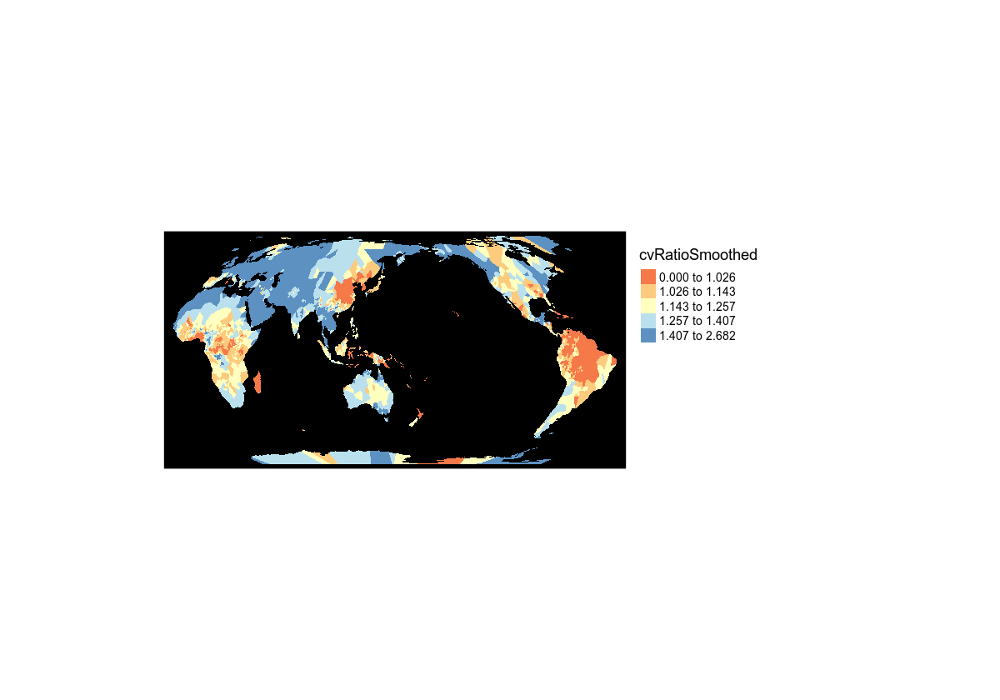

In [62]:
cvVoronoi.smoothed %>%
    st_transform("+proj=eqearth lon_0=160") %>%
    tm_shape() +
    tm_fill(col="cvRatioSmoothed", style="quantile", palette = "RdYlBu")  +
    tm_layout(legend.outside=T) 

### Same procedure for Phoible data

Voronoi polygons

In [63]:
v <- segmentFrequencies %>%
    st_geometry() %>%
    st_coordinates() %>%
    st_multipoint() %>%
    st_voronoi() 


In [64]:
v_sfc <- v %>%
    lapply(function(x) x) %>%
    st_sfc()
st_crs(v_sfc) <- st_crs(world.160e)

In [65]:
st_crs(segmentFrequencies) <- st_crs(world.160e)

In [66]:
phoibleVoronoi <- v_sfc %>% 
    st_sf() %>%
    st_join(segmentFrequencies) %>%
    st_intersection(st_union(world.160e))

Warning message in st_is_longlat(x):
“bounding box has potentially an invalid value range for longlat data”although coordinates are longitude/latitude, st_intersects assumes that they are planar
although coordinates are longitude/latitude, st_union assumes that they are planar
Warning message in st_is_longlat(x):
“bounding box has potentially an invalid value range for longlat data”although coordinates are longitude/latitude, st_intersection assumes that they are planar
Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”

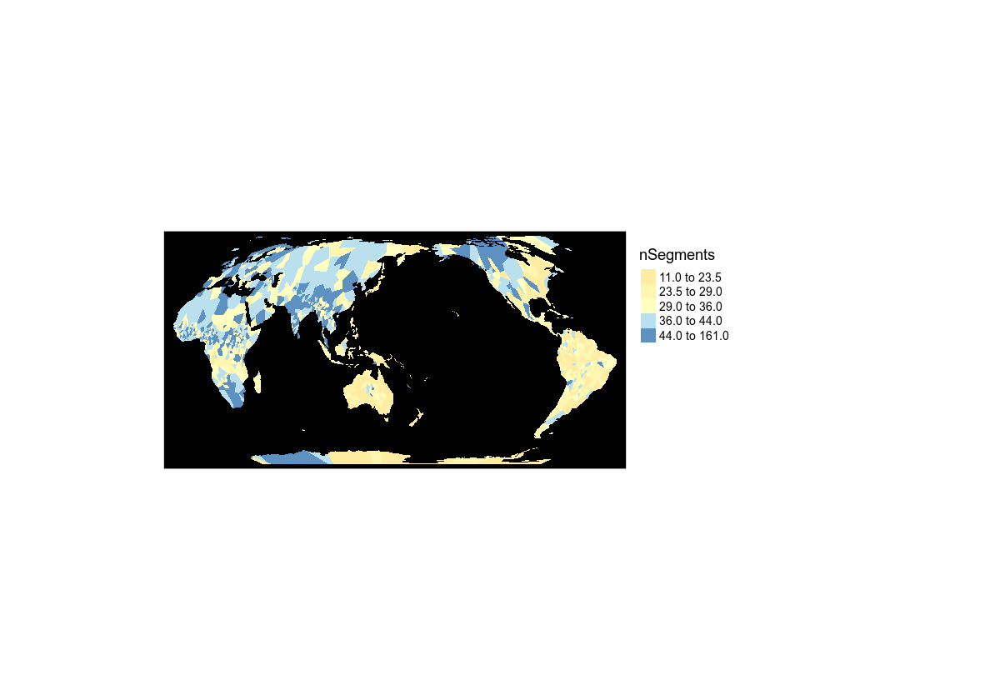

In [67]:
phoibleVoronoi %>%
    st_transform("+proj=eqearth lon_0=160") %>%
    tm_shape() +
    tm_fill(col="nSegments", style="quantile", palette = "RdYlBu") +
    tm_layout(legend.outside=T)

In [68]:
phoible_nb <- poly2nb(phoibleVoronoi, queen=TRUE)
phoible_lw <- nb2listw(phoible_nb, style="W", zero.policy = T)


In [70]:
phoible.lag = lag.listw(phoible_lw, phoibleVoronoi$nSegments, zero.policy = T)

In [71]:
phoibleVoronoi.smoothed <- phoibleVoronoi %>%
    mutate(nSegmentsSmoothed = phoible.lag)

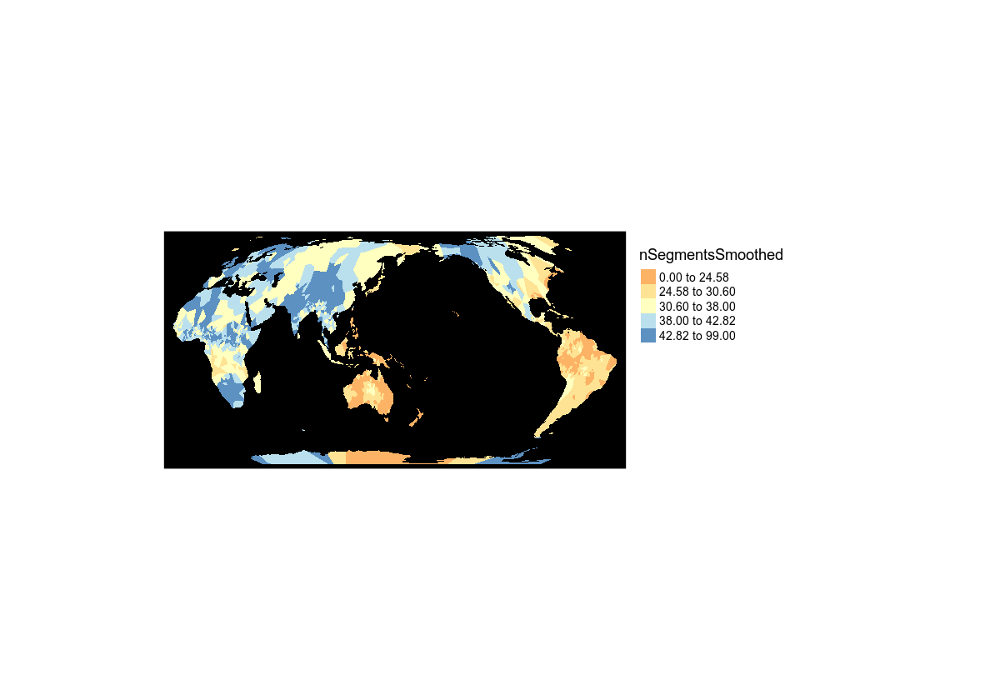

In [72]:
phoibleVoronoi.smoothed %>%
    st_transform("+proj=eqearth lon_0=160") %>%
    tm_shape() +
    tm_fill(col="nSegmentsSmoothed", style="quantile", palette = "RdYlBu") +
    tm_layout(legend.outside=T)

## Segment inventories and population size

Hay and Bauer (2007; *Language* 83, 388-400) noticed a robust correlation between the size of phoneme inventories and the number of speakers of a language.

Moran, McCloy & Write (2012, *Language* 88, 877-893) argue that this is a statistical artifact.

Let us take a closer look.

ASJP contains information about the number of speakers of a language. We can combine this information with the Phoible data.

In [73]:
asjp1 = read_tsv(url("https://osf.io/3xgjc/download"))


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  .default = col_character(),
  lat = col_double(),
  lon = col_double(),
  pop = col_double(),
  wcode = col_logical()
)
ℹ Use `spec()` for the full column specifications.



In [74]:
asjp1 %>%
    slice_sample(n=10)

names,wls_fam,wls_gen,e,hh,lat,lon,pop,wcode,iso,...,black,night,hot,cold,full,new,good,round,dry,name
DOURA,An,OCEANIC,"Austronesian,Malayo-Polynesian,Central-EasternMalayo-Polynesian,EasternMalayo-Polynesian,Oceanic,WesternOceanic,PapuanTip,Peripheral,CentralPapuan,WestCentralPapuan,Nuclear","Austronesian,Malayo-Polynesian,Central-EasternMalayo-Polynesian,EasternMalayo-Polynesian,Oceanic,WesternOceaniclinkage,PapuanTiplinkage,PeripheralPapuanTiplinkage,CentralPapuanOceanic,WestCentralPapuanlinkage,NuclearWestCentralPapuanlinkage",-9.08,147.00,1800,NA,don,...,NA,vapura,NA,NA,NA,makamakana,NA,NA,NA,ata
CINDA_1,NC,KAINJI,"Niger-Congo,Atlantic-Congo,Volta-Congo,Benue-Congo,Kainji,Western,Kamuku","Atlantic-Congo,Volta-Congo,Benue-Congo,Kainji,CentralKainji,Shiroro-Kamuku,Kamuku-Hungwarya,Kamuku",10.33,6.00,45000,NA,cdr,...,NA,gy~Eta,NA,NA,NA,upw~o,NA,NA,NA,iZi
BONGGI,An,NORTH_BORNEO,"Austronesian,Malayo-Polynesian,GreaterCentralPhilippine,Palawanic","Austronesian,Malayo-Polynesian,NorthBorneoMalayo-Polynesian,NortheastSabahan",10.00,123.00,0,NA,bdg,...,NA,raobi,NA,NA,NA,baru,NA,NA,NA,eNardn~
KICHEE_NAHUALA_1,May,MAYAN,"Mayan,Yucatecan-CoreMayan,K'ichean-Mamean,K'ichean,Poqom-K'ichean,CoreK'ichean","Mayan,CoreMayan,Quichean-Mamean,GreaterQuichean,CoreQuichean,Quiche-Achi",14.78,-91.50,2330000,NA,quc,...,NA,"CaXab""",NA,NA,noXnaq,"k""ak""",NA,NA,NA,"b""i7aX"
BUBE,NC,BANTOID,"Niger-Congo,Atlantic-Congo,Volta-Congo,Benue-Congo,Bantoid,Southern,NarrowBantu,Northwest,A,Bubi-Benga(A.31)","Atlantic-Congo,Volta-Congo,Benue-Congo,Bantoid,SouthernBantoid,NarrowBantu",3.50,8.67,51000,NA,bvb,...,NA,viti,NA,NA,duga,NA,NA,NA,NA,ina
TODA_TAROKO,An,ATAYALIC,"Austronesian,Atayalic","Austronesian,Atayalic",24.17,121.42,20000,NA,trv,...,NA,T3karabi,NA,NA,NA,burah,NA,NA,NA,haNan
KENYANG_KITWII,NC,BANTOID,"Niger-Congo,Atlantic-Congo,Volta-Congo,Benue-Congo,Bantoid,Southern,Mamfe","Atlantic-Congo,Volta-Congo,Benue-Congo,Bantoid,SouthernBantoid,Mamfe",5.67,9.50,65000,NA,ken,...,NA,ti,NA,NA,NA,ko,NA,NA,NA,5En
ASSAN,Yen,YENISEIAN,"Yeniseian,KA","Yeniseian,SouthernYeniseian",55.00,94.00,0,NA,xss,...,NA,Sig,NA,NA,NA,NA,NA,NA,NA,NA
EYAK,NDe,EYAK,Eyak-Athabaskan,"Athabaskan-Eyak-Tlingit,Athabaskan-Eyak",60.50,-145.00,0,NA,eya,...,NA,"XeXXek""",NA,NA,d3s,"q""aya",NA,NA,NA,"o7a, e7a*"
IBINO,NC,CROSS_RIVER,"Niger-Congo,Atlantic-Congo,Volta-Congo,Benue-Congo,CrossRiver,DeltaCross,LowerCross,Obolo,Ibino","Atlantic-Congo,Volta-Congo,Benue-Congo,DeltaCross,LowerCross",4.58,8.17,10000,NA,ibn,...,NA,tur oCio,NA,NA,oCoro,ufa,NA,NA,NA,CiN


In [75]:
asjp2 = read_csv(url("https://raw.githubusercontent.com/lexibank/asjp/v18/cldf/languages.csv"))


── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  ID = col_character(),
  Name = col_character(),
  Glottocode = col_character(),
  Glottolog_Name = col_character(),
  ISO639P3code = col_character(),
  Macroarea = col_character(),
  Latitude = col_double(),
  Longitude = col_double(),
  Family = col_character(),
  classification_wals = col_character(),
  classification_ethnologue = col_character(),
  classification_glottolog = col_character(),
  recently_extinct = col_logical(),
  long_extinct = col_logical(),
  year_of_extinction = col_double(),
  code_wals = col_character(),
  code_iso = col_character(),
  transcribers = col_character()
)



In [76]:
asjp2 %>%
    slice_sample(n=10)

ID,Name,Glottocode,Glottolog_Name,ISO639P3code,Macroarea,Latitude,Longitude,Family,classification_wals,classification_ethnologue,classification_glottolog,recently_extinct,long_extinct,year_of_extinction,code_wals,code_iso,transcribers
SYLHETI,SYLHETI,sylh1242,Sylheti,syl,Eurasia,24.84,92.25,Indo-European,IE.INDIC,"Indo-European,Indo-Iranian,Indo-Aryan,OuterLanguages,Eastern,Bengali-Assamese","Indo-European,Indo-Iranian,Indo-Aryan,Indo-AryanEasternzone,Oriya-Gauda-Kamrupa,Gauda-Kamrupa,Gauda-Banga,EasternBengali",FALSE,FALSE,NA,NA,syl,Tessa de Mol-van Valen
NGAMBAY,NGAMBAY,ngam1268,Ngambay,sba,Africa,8.67,16.00,Central Sudanic,CSu.BONGO-BAGIRMI,"Nilo-Saharan,Satellite-Core,Satellites,CentralSudanic,West,Bongo-Bagirmi,Sara-Bagirmi,Sara,SaraProper","Central_Sudanic,Sara-Bongo-Bagirmi,SBBOccidental,NuclearSBBOccidental,Saraic,SaraCentral,SaraCentralLogone",FALSE,FALSE,NA,ngm,sba,Søren Wichmann and Viveka Velupillai
RUC2,RUC_2,chut1247,Chut,scb,Eurasia,17.90,105.85,Austroasiatic,AuA.VIET-MUONG,"Austro-Asiatic,Mon-Khmer,Viet-Muong,Chut","Austroasiatic,Vietic,Chutic,EastChutic",FALSE,FALSE,NA,NA,scb,Paul Sidwell and Søren Wichmann
SHUAR,SHUAR,shua1257,Shuar,jiv,South America,-2.50,-78.00,Chicham,Jiv.JIVAROAN,"Jivaroan,Jivaro","Chicham,Shuaric",FALSE,FALSE,NA,jiv,jiv,Patience Epps and Søren Wichmann
KARSHI,KARSHI,gwan1268,Gwandara,gwn,Africa,8.67,8.08,Afro-Asiatic,AA.WEST_CHADIC,"Afro-Asiatic,Chadic,West,A,A.1","Afro-Asiatic,Chadic,WestChadic,WestChadicA,WestChadicA.1",FALSE,FALSE,NA,NA,gwn,Viveka Velupillai
VIRA,VIRA,joba1238,Joba,job,Africa,-3.50,29.00,Atlantic-Congo,NC.BANTOID,"Niger-Congo,Atlantic-Congo,Volta-Congo,Benue-Congo,Bantoid,Southern,NarrowBantu,Central,J,Ruanda-Rundi(D.631)","Atlantic-Congo,Volta-Congo,Benue-Congo,Bantoid,SouthernBantoid,NarrowBantu,EastBantu,NortheastSavannaBantu,GreatLakesBantu,WesternLakesBantu,Kivu,ForestKivu,Fuliiric,Fuliiru-Vira",FALSE,FALSE,NA,NA,job,Ann-Katrin Wett
ADUMANISULUKOMERING,ADUMANIS_ULU_KOMERING,kome1238,Komering,kge,Papunesia,-4.00,105.00,Austronesian,An.LAMPUNGIC,"Austronesian,Malayo-Polynesian,Lampung","Austronesian,Malayo-Polynesian,Lampungic",FALSE,FALSE,NA,kag,kge,Sebastian Sauppe
VAAGRIBOLI,VAAGRI_BOLI,vaag1238,Vaagri Booli,vaa,Eurasia,12.54,79.10,Indo-European,IE.INDIC,"Indo-European,Indo-Iranian,Indo-Aryan,Unclassified","Indo-European,Indo-Iranian,Indo-Aryan,Indo-AryanCentralzone,SubcontinentalCentralIndo-Aryan,Bhil",FALSE,FALSE,NA,NA,vaa,André Müller
EPENABASURUDO,EPENA_BASURUDO,epen1239,Epena,sja,South America,3.00,-77.00,Chocoan,Cho.CHOCO,"Chocoan,Embera,SouthernEmbera","Chocoan,Embera,SanJuan",FALSE,FALSE,NA,epe,sja,Cecil H. Brown
PURI,PURI,puri1262,Puri,prr,South America,-19.50,-42.50,Puri-Coroado,MGe.PURI,Purian,Puri-Coroado,TRUE,FALSE,NA,NA,prr,NA


In [77]:
population_segments <- asjp1 %>%
    select(names, pop) %>%
    mutate(logPop = log10(pop)) %>%
    mutate(ID = names, .keep="all") %>%
    select(ID, logPop) %>%
    filter(logPop > -Inf) %>%
    inner_join(asjp2) %>%
    group_by(Glottocode) %>%
    summarize(logPop = median(logPop))  %>%
    inner_join(segmentFrequencies)  %>%
    st_as_sf()

Joining, by = "ID"
Joining, by = "Glottocode"


In [78]:
st_crs(population_segments) <- 4326


In [79]:
population_segments %>%
    slice_sample(n=10)

Glottocode,logPop,nSegments,geometry
afar1241,6.294025,27,POINT (41.8083 12.2281)
tatu1247,2.602060,17,POINT (-70.5327 0.55582)
chim1302,5.903090,36,POINT (-78.8521 -1.36727)
jowu1238,4.041393,45,POINT (-5.47873 10.7691)
tepo1239,4.497621,39,POINT (-7.66346 5.16267)
chon1287,5.264818,47,POINT (38.672 -6.518)
haya1250,6.240549,29,POINT (31.4846 -1.70878)
band1352,5.139879,48,POINT (-10.1684 7.73729)
dyir1250,1.462398,16,POINT (145.544 -17.4516)
hind1269,8.415179,61,POINT (77 25)


`geom_smooth()` using formula 'y ~ x'


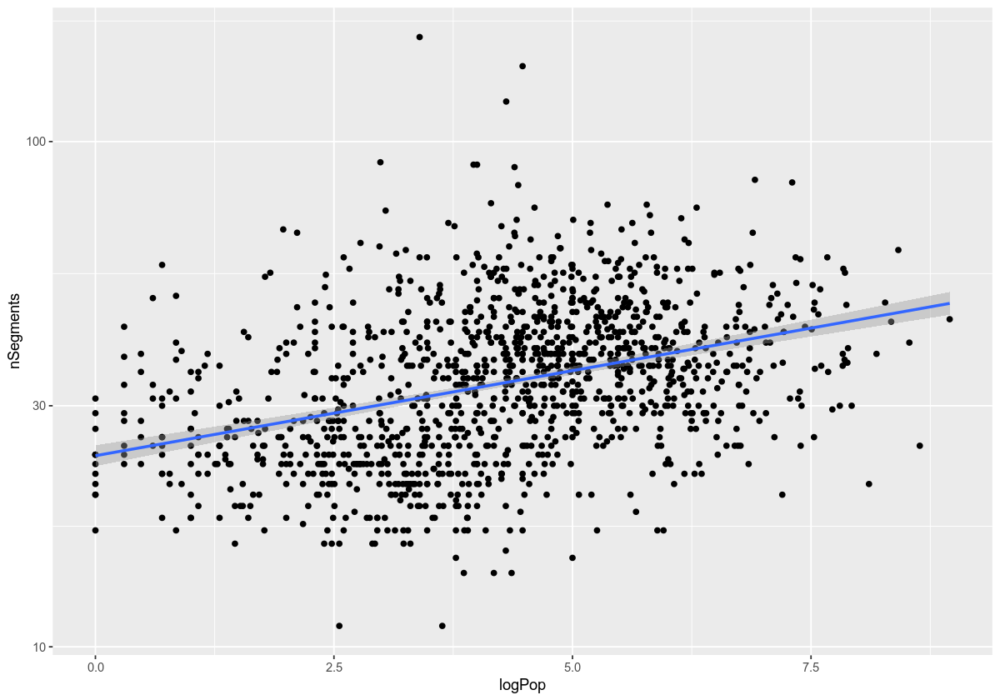

In [80]:
population_segments %>%
    ggplot(aes(x=logPop, y = nSegments)) +
    geom_point() +
    scale_y_log10() +
    geom_smooth(method='lm')

In [81]:
v <- population_segments %>%
    st_geometry() %>%
    st_coordinates() %>%
    st_multipoint() %>% 
    st_voronoi()  


v_sfc <- v %>%
    lapply(function(x) x) %>%
    st_sfc()

st_crs(v_sfc) <- 4326



psVoronoi <- v_sfc %>% 
    st_sf() %>%
    st_join(population_segments) %>%
    mutate(logSegments = log10(nSegments)) %>%
    st_intersection(st_union(world.160e))


Warning message in st_is_longlat(x):
“bounding box has potentially an invalid value range for longlat data”although coordinates are longitude/latitude, st_intersects assumes that they are planar
although coordinates are longitude/latitude, st_union assumes that they are planar
Warning message in st_is_longlat(x):
“bounding box has potentially an invalid value range for longlat data”although coordinates are longitude/latitude, st_intersection assumes that they are planar
Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”

In [82]:
psVoronoi %>% slice_sample(n=10)

Glottocode,logPop,nSegments,logSegments,geometry
lamb1276,4.301030,19,1.278754,POLYGON ((-79.76228 -4.3724...
kusa1250,5.739572,44,1.643453,POLYGON ((-0.8391279 11.474...
kama1365,3.778151,28,1.447158,MULTIPOLYGON (((124.9998 -8...
dadi1250,4.000000,23,1.361728,POLYGON ((145.0513 -7.73308...
wich1264,4.176091,28,1.447158,POLYGON ((-64.75332 -22.966...
nami1256,3.778151,15,1.176091,POLYGON ((141.5522 -3.56122...
manc1252,1.301030,25,1.397940,"POLYGON ((127.5042 55.9314,..."
pany1241,1.991226,25,1.397940,"POLYGON ((117.1565 -24.547,..."
ncan1245,4.120574,41,1.612784,POLYGON ((10.41129 6.400517...
daha1245,2.602060,59,1.770852,POLYGON ((41.44001 0.852144...


In [83]:
p1 <- psVoronoi %>%
    drop_na() %>%
    st_transform("+proj=eqearth lon_0=160") %>%
    tm_shape() +
    tm_fill(col="logSegments", style="quantile", palette = "RdYlBu") +
    tm_layout(legend.outside=T, bg.color = 'grey')

In [84]:
p2 <- psVoronoi %>%
    st_transform("+proj=eqearth lon_0=160") %>%
    tm_shape() +
    tm_fill(col="logPop", style="quantile", palette = "RdYlBu") +
    tm_layout(legend.outside=T, bg.color = "gray")

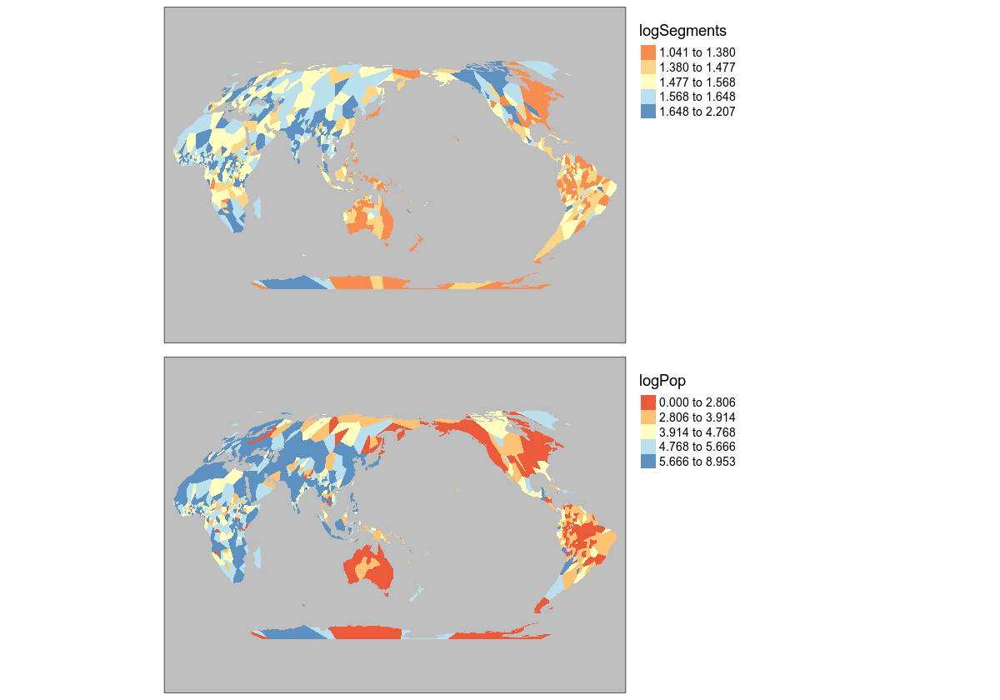

In [85]:
tmap_arrange(p1, p2, ncol=1)

In [86]:
ps_nb <- poly2nb(psVoronoi, queen=TRUE)
ps_lw <- nb2listw(ps_nb, style="W", zero.policy = T)

In [89]:
segments.lag = lag.listw(ps_lw, psVoronoi$logSegments, zero.policy = T)
pop.lag = lag.listw(ps_lw, psVoronoi$logPop, zero.policy = T)

In [90]:
psVoronoi.smoothed <- psVoronoi %>%
    mutate(logSegmentsSmoothed = segments.lag) %>%
    mutate(logPopSmoothed = pop.lag)

In [91]:
p3 <- psVoronoi.smoothed %>%
    drop_na() %>%
    st_transform("+proj=eqearth lon_0=160") %>%
    tm_shape() +
    tm_fill(col="logSegmentsSmoothed", style="quantile", palette = "RdYlBu") +
    tm_layout(legend.outside=T, bg.color = 'grey')

In [92]:
p4 <- psVoronoi.smoothed %>%
    drop_na() %>%
    st_transform("+proj=eqearth lon_0=160") %>%
    tm_shape() +
    tm_fill(col="logPopSmoothed", style="quantile", palette = "RdYlBu") +
    tm_layout(legend.outside=T, bg.color = 'grey')

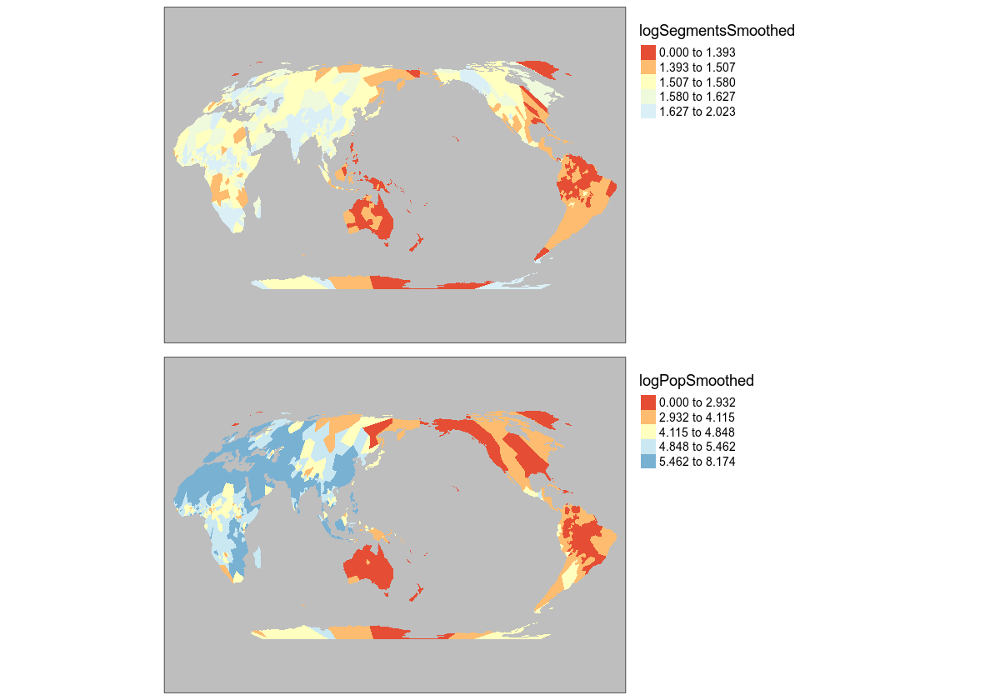

In [93]:
tmap_arrange(p3, p4)

In [103]:
if ("spatialreg" %in% rownames(installed.packages()) == FALSE) {
    install.packages("spatialreg")
}

library(spatialreg)

Data preparation:
- remove data points where spatial lag cannot be computed
- scale continuous variables (linear transformation, sets mean to 0 and standard deviation to 1)

In [95]:
d <- drop_na(psVoronoi.smoothed, logPopSmoothed)


ps_nb <- poly2nb(d, queen=TRUE)
ps_lw <- nb2listw(ps_nb, style="W", zero.policy = T)

In [96]:
d %>%
    mutate(logPopSc = (logPop-mean(logPop))/sd(logPop)) %>%
    mutate(logSegmentsSc = (logSegments-mean(logSegments))/sd(logSegments)) -> d

`geom_smooth()` using formula 'y ~ x'


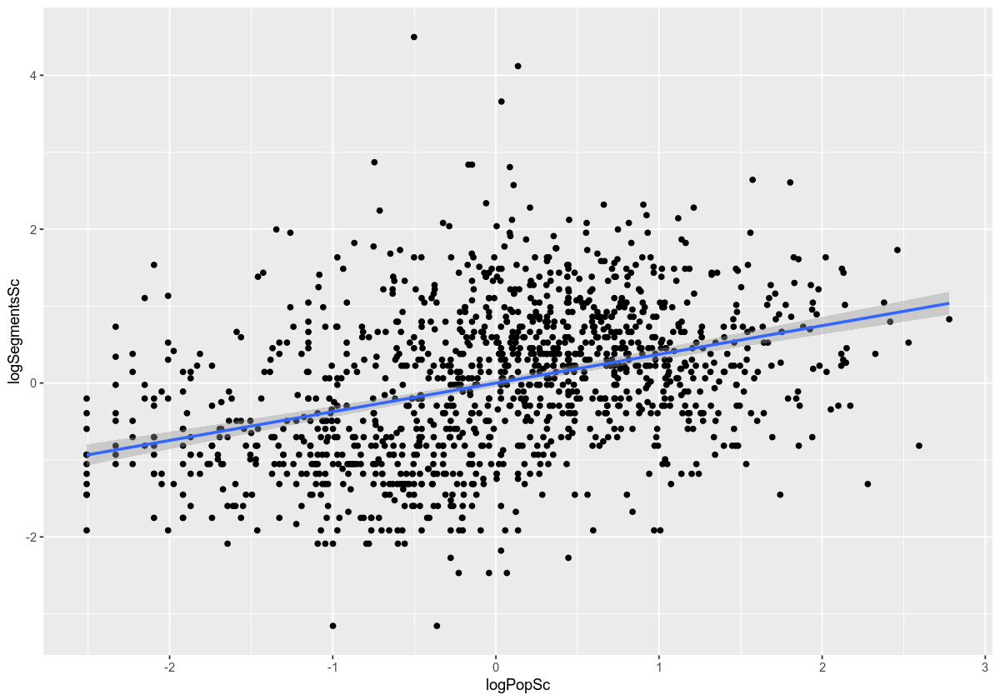

In [97]:
d %>%
    ggplot(aes(x = logPopSc, y = logSegmentsSc)) + geom_point()  + geom_smooth(method='lm')

### Ordinary linear regression


$$
    Y = X\beta + \varepsilon
$$

In [98]:
fit.lm <- lm(logSegmentsSc ~ logPopSc, data = d)
summary(fit.lm)


Call:
lm(formula = logSegmentsSc ~ logPopSc, data = d)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.0222 -0.6095 -0.0198  0.6000  4.6844 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -3.970e-16  2.582e-02    0.00        1    
logPopSc     3.729e-01  2.583e-02   14.44   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.9282 on 1290 degrees of freedom
Multiple R-squared:  0.1391,	Adjusted R-squared:  0.1384 
F-statistic: 208.4 on 1 and 1290 DF,  p-value: < 2.2e-16


In [99]:
AIC(fit.lm)

[1] 3478.046

In [102]:
lm.morantest(fit.lm, ps_lw, zero.policy = T)


	Global Moran I for regression residuals

data:  
model: lm(formula = logSegmentsSc ~ logPopSc, data = d)
weights: ps_lw

Moran I statistic standard deviate = 21.706, p-value < 2.2e-16
alternative hypothesis: greater
sample estimates:
Observed Moran I      Expectation         Variance 
    0.3909010337    -0.0012556159     0.0003263957 
